## 1. パッケージのインストール

In [2]:
@time using CSV                          # CSVファイルの操作のためのパッケージ
@time using DataFrames                   # データフレーム
@time using Distributions                # 確率分布
@time using NLsolve                      # 非線形方程式の近似根を求める
@time using Plots                        # グラフ描画
@time using Parameters                   # 数値モデルのパラメーターを処理するために使用するパッケージ
@time using QuadGK                       # 1次元の数値積分
@time using SpecialFunctions             # 特殊関数
@time using StatsBase                    # 統計にかかわる基本的な関数群が提供されているパッケージ

  1.900633 seconds (4.74 M allocations: 269.480 MiB, 2.52% gc time, 89.45% compilation time)
  0.885261 seconds (1.84 M allocations: 125.500 MiB, 5.31% gc time)
  0.783590 seconds (2.92 M allocations: 165.005 MiB, 3.53% gc time, 40.13% compilation time)
  0.588111 seconds (2.47 M allocations: 174.724 MiB, 1.43% compilation time)
  3.589933 seconds (9.10 M allocations: 587.081 MiB, 12.38% gc time, 19.00% compilation time)
  0.000061 seconds (109 allocations: 9.516 KiB)
  0.000061 seconds (109 allocations: 9.516 KiB)
  0.000037 seconds (109 allocations: 9.531 KiB)
  0.000053 seconds (109 allocations: 9.516 KiB)


## 2. イベントサイズの分布　$ρ(m)$

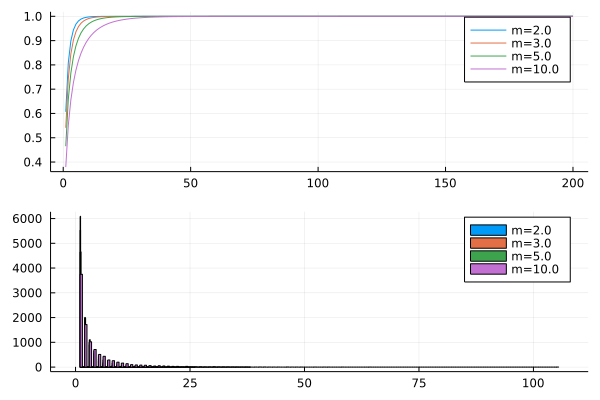

In [3]:
# 確率質量関数 ( PMF : probability mass function )
ρ(ω,m) = ω^m/(m*log(ω+1)*(ω+1)^m)

# 累積分布関数 ( CDF : cumulative distribution function )
function ζ(ω,M=200)
    x = zeros(M)
    cdf = 0.0
    for m in 1:M
        cdf += ρ(ω,m) 
        x[m] = cdf
    end
    return x
end

# イベントサイズ m
@inline function ξ(ω,x,M=200)
    y = rand(Uniform(0,1))
    if x[M] <= y[1] 
        m = M
    else
        for i in 1:M-1
            if x[i] >= y[1]
                m = i
                break
            else
                continue
            end
        end
    end
    return m
end;

#Plot
x1 = [ξ(2.0,ζ(2.0)) for i in 1:10000]
x2 = [ξ(3.0,ζ(3.0)) for i in 1:10000]
x3 = [ξ(5.0,ζ(5.0)) for i in 1:10000]
x4 = [ξ(10.0,ζ(10.0)) for i in 1:10000]

plt  = (plot(ζ(2.0),label="m=2.0") ; plot!(ζ(3.0),label="m=3.0") ; plot!(ζ(5.0),label="m=5.0") ; plot!(ζ(10.0),label="m=10.0"))
hist = histogram(x1,label="m=2.0") ; histogram!(x2,label="m=3.0") ; histogram!(x3,label="m=5.0") ; histogram!(x4,label="m=10.0")

plot(plt,hist,layout=(2,1))

In [15]:
# イベントサイズの分布
import Distributions: quantile, minimum, maximum, pdf, cdf

mutable struct Myprob{T <: Real} <: DiscreteUnivariateDistribution
    ω::T
end
ω = 0.01
prob = Myprob(ω)

quantile(prob::Myprob,m) = prob.ω^m/(m*log(prob.ω+1)*(prob.ω+1)^m)

quantile(prob,1) # イベントサイズが"1"の場合の分位点(GPT3.5)

0.9950412951201034

## 3.非線形方程式の解の導出

In [16]:
# 非線形方程式 ( Non-linear equations )
@inline fun(t,λ0,λ,τ,ω,K,Δ) = λ0*t+sum([λ[i,1]*τ[i]*(1-exp(-t/τ[i])) for i in 1:K])-Δ*ω/log(ω+1)

# 解の導出 Find solutions to non-linear equations
@inline function nls(func, params...; ini = [0.0]) 
    if typeof(ini) <: Number
        r = nlsolve((vout,vin)->vout[1]=func(vin[1],params...), [ini])
        v = r.zero[1]
    else
        r = nlsolve((vout,vin)->vout .= func(vin,params...), ini)
        v = r.zero
    end
    return v, r.f_converged
end

nls(fun,0.01,0.99,1.0,2.0,1,rand(Exponential(1)),ini=0.0) # (近似根, true : 近似根 f=0 を満たす) 

(60.01055416867044, true)

## 4.メモリーカーネル：指数関数

### 手法：時間伸縮理論

In [17]:
# Jump in [t,t+dt]
@inline jump(t,λ,τ,n,m) = λ*exp(-t/τ)+n*m/τ

# No jump during [t,t+dt]
@inline no_jump(λ,τ,t) = λ*exp(-t/τ)

# イベント時刻 (T,N) = (10^8,10^8) @time : 13.038416 seconds (2 allocations: 762.939 MiB, 0.72% gc time)
function time(T,N)
    t = rand(Uniform(0.0,T),N)
    sort!(t) # 昇順に並び替える
    return t
end;

# 手法 : 時間伸縮理論 ( Time-rescaling theorem )
function Time_Rescaling_Theorem(par,T=10^4,N=10^4) # (T,N) = (実時間,データ数)
    @unpack K,λ0,ω,n = par
    
    # 空の配列
    λt = zeros(N) # N = 10^8 @time 0.426187 seconds
    λ  = zeros(K,2)
    tΔ = zeros(2)
    
    # イベント発生時刻
    t = time(T,N)
    
    # 時間減衰項 τ 
    τ = rand(Uniform(1.0,3.0),K) #連続型
    #   rand(DiscreteUniform(min=1,max=3),K) #離散型
    
    # 分岐比 n 
    n = [n/K for i in 1:K]
    
    # 累積分布関数
    CDF = ζ(ω)
    
    # 解 (イベント発生時刻) の導出 
    Δ = nls(fun,λ0,λ[:,1],τ,ω,K,rand(Exponential(1)),ini=0.0)[1] # x[:,1] : 1列目を取る
    tΔ[2] = tΔ[1] + Δ
    m = ξ(ω,CDF)
    λ[:,2] = [jump(Δ,λ[i,1],τ[i],n[i],m) for i in 1:K]
    for i in 1:N
        while true
            if t[i] < tΔ[2]
                δ = t[i] - tΔ[1]
                λt[i] = λ0+sum([no_jump(λ[i,1],τ[i],δ) for i in 1:K])
                break
            else
                tΔ[1] = tΔ[2]
                λ[:,1] = λ[:,2]
                Δ = nls(fun,λ0,λ[:,1],τ,ω,K,rand(Exponential(1)),ini=0.0)[1]
                tΔ[2] = tΔ[1] + Δ
                m = ξ(ω,CDF)
                λ[:,2] = [jump(Δ,λ[i,1],τ[i],n[i],m) for i in 1:K]
            end
        end
    end
    t,τ,n,λt
end

# パラメータ
par = (
    K  = 5, # メモリーカーネル関数( 指数関数 )の数
    n  = 0.99, # 分岐比
    ω  = 0.01,
    λ0 = 0.01
)

@time t,τ,n,λt = Time_Rescaling_Theorem(par)
println("・分岐比 　n = $n")
println("・時間減衰 τ = $τ")

# データフレーム
df = DataFrame(Time=t,Intensity=λt) 
@show describe(df.Intensity)

# CSV
#CSV.write("/home/aaa/bbb/data_name.csv",df)

# Plot
plt = plot(df.Time,df.Intensity,xlabel = "Time",ylabel = "Intensity",title  = "Hawkes process",label  = "")
hist = histogram(df.Intensity,xlabel = "Intensity",ylabel = "Counts",title = "Frequency distribution",label = "")
plot(plot!(plt,x->mean(df.Intensity),label="Mean value",legendfontsize=5),hist,layout=(2,1))

  0.485900 seconds (2.03 M allocations: 110.484 MiB, 6.49% gc time, 89.07% compilation time)
・分岐比 　n = [0.198, 0.198, 0.198, 0.198, 0.198]
・時間減衰 τ = [2.1436202200251033, 2.0104390497734212, 1.9790123669197237, 2.1471178248275815, 1.043935901074771]
Summary Stats:
Length:         10000
Missing Count:  0
Mean:           0.771569
Minimum:        0.010000
1st Quartile:   0.010000
Median:         0.010000
3rd Quartile:   0.010528
Maximum:        40.883880
Type:           Float64
describe(df.Intensity) = nothing


## 5.メモリーカーネル：べき乗関数
### 参考：ガンマ分布

・全事象が起こる確率:(結果, 誤差の推定値)=(0.9999999999999998, 2.840828626635481e-10)


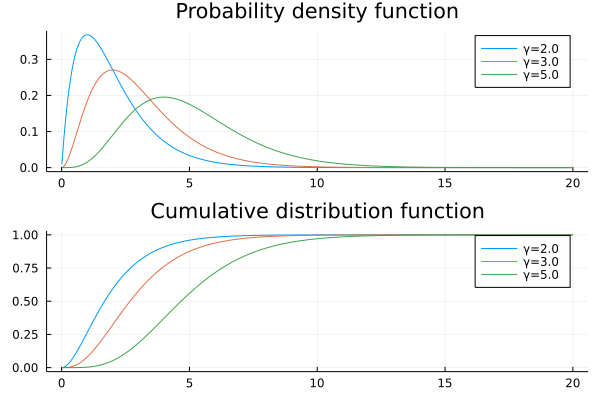

In [18]:
## 確率密度関数
PDF_Γ(r,γ,α=1.0) = α^γ*r^(γ-1)*exp(-α*r)/gamma(γ)

f(r) = PDF_Γ(r,2.0) # γ = 2.0
x = quadgk(f,0,Inf,rtol=1e-8) # 積分範囲:(0,∞),相対許容誤差 10-8 で計算
println("・全事象が起こる確率:(結果, 誤差の推定値)=$x")

## 累積分布関数 
#CDF_Γ(r,γ,α=1.0) = (gamma(γ)-gamma(γ,α*r))/gamma(γ)
CDF_Γ(r,γ,α=1.0) = 1 - gamma(γ,α*r)/gamma(γ) # 分母:ガンマ関数,分子:第1種不完全ガンマ関数 ( 第1種不完全ガンマ関数 + 第2種不完全ガンマ関数 = ガンマ関数)

#Plot
x = [i for i in 0.01:0.01:20.0]
y1 = [PDF_Γ(i,2.0) for i in 0.01:0.01:20.0]
y2 = [PDF_Γ(i,3.0) for i in 0.01:0.01:20.0]
y3 = [PDF_Γ(i,5.0) for i in 0.01:0.01:20.0]
plt1  = (plot(x,y1,label="γ=2.0",title="Probability density function") ; plot!(x,y2,label="γ=3.0") ; plot!(x,y3,label="γ=5.0"))

y1 = [CDF_Γ(i,2.0) for i in 0.01:0.01:20.0]
y2 = [CDF_Γ(i,3.0) for i in 0.01:0.01:20.0]
y3 = [CDF_Γ(i,5.0) for i in 0.01:0.01:20.0]
plt2  = (plot(x,y1,label="γ=2.0",title="Cumulative distribution function") ; plot!(x,y2,label="γ=3.0") ; plot!(x,y3,label="γ=5.0"))

plot(plt1,plt2,layout=(2,1))

### 参考：逆ガンマ分布

・全事象が起こる確率:(結果, 誤差の推定値)=(0.9999999999999997, 2.8408277767480325e-10)


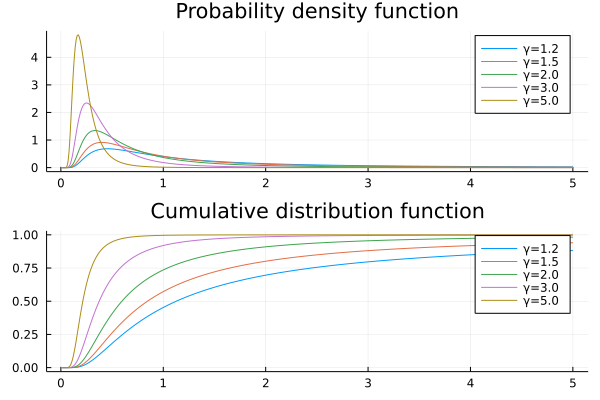

In [19]:
# 逆ガンマ分布
## 確率密度関数
PDF_IΓ(x,γ,α=1.0) = (α^γ*exp(-α/x))/(gamma(γ)*x^(γ+1))

f(r) = PDF_IΓ(r,2.0) # γ = 2.0
x = quadgk(f,0,Inf,rtol=1e-8) # 積分範囲:(0,∞),相対許容誤差 10-8 で計算
println("・全事象が起こる確率:(結果, 誤差の推定値)=$x")

## 累積分布関数 
CDF_IΓ(τ,γ,α=1.0) = gamma(γ,α/τ)/gamma(γ)

#Plot
x = [i for i in 0.01:0.01:5.0]
y1 = [PDF_IΓ(i,1.2) for i in 0.01:0.01:5.0]
y2 = [PDF_IΓ(i,1.5) for i in 0.01:0.01:5.0]
y3 = [PDF_IΓ(i,2.0) for i in 0.01:0.01:5.0]
y4 = [PDF_IΓ(i,3.0) for i in 0.01:0.01:5.0]
y5 = [PDF_IΓ(i,5.0) for i in 0.01:0.01:5.0]
plt1  = (plot(x,y1,label="γ=1.2",title="Probability density function") ; plot!(x,y2,label="γ=1.5") ; plot!(x,y3,label="γ=2.0") ; plot!(x,y4,label="γ=3.0") ; plot!(x,y5,label="γ=5.0"))

y1 = [CDF_IΓ(i,1.2) for i in 0.01:0.01:5.0]
y2 = [CDF_IΓ(i,1.5) for i in 0.01:0.01:5.0]
y3 = [CDF_IΓ(i,2.0) for i in 0.01:0.01:5.0]
y4 = [CDF_IΓ(i,3.0) for i in 0.01:0.01:5.0]
y5 = [CDF_IΓ(i,5.0) for i in 0.01:0.01:5.0]
plt2  = (plot(x,y1,label="γ=1.2",title="Cumulative distribution function") ; plot!(x,y2,label="γ=1.5") ; plot!(x,y3,label="γ=2.0") ; plot!(x,y4,label="γ=3.0") ; plot!(x,y5,label="γ=5.0"))

plot(plt1,plt2,layout=(2,1))

## 逆ガンマ分布の確率密度関数$f_{IΓ}(τ)$と減衰時間$τ$:

### $n = \displaystyle \int_{0}^{\infty} f_{IΓ}(τ) dτ$

In [20]:
# 非線形関数
CDF_IΓ_n(τ,γ,n) = CDF_IΓ(τ,γ)-n

## 分岐比 n,時間減衰項 τ
function n_τ(K,n,γ)
    x = [(k-0.5)/K for k in 1:K] ; x = x/x[end] # 分岐比 n
    τ = [nls(CDF_IΓ_n,γ,x[k],ini=0.1)[1] for k in 1:K] # 時間減衰項 τ
    n = [n/K for k in 1:K]
    return(n,τ)
end

K = 1000 ; n = 0.99 ; γ = 11.0
n,τ=n_τ(K,n,γ)
x = mean(τ)
println("・期待値 E[τ]=$x (K=$K,n=0.99,γ=$γ)")

K = 10 ; n = 0.99 ; γ = 11.0
println("・パラメータ:K=$K,n=$n,γ=$γ")

x = [(k-0.5)/K for k in 1:K] 
x = x/x[end]

function solver()
    τ = [nls(CDF_IΓ_n,γ,x[k],ini=0.1)[1] for k in 1:K]
    for i in 1:K
        p = n/K
        q = τ[i]
        println("   f(τ)=$p, τ=$q")
    end
    r = mean(τ)
    println("・期待値 E[τ] = $r")
end
solver()

・期待値 E[τ]=0.10086610223202792 (K=1000,n=0.99,γ=11.0)
・パラメータ:K=10,n=0.99,γ=11.0
   f(τ)=0.099, τ=0.059339843987051034
   f(τ)=0.099, τ=0.0700310593831873
   f(τ)=0.099, τ=0.07771001130789819
   f(τ)=0.099, τ=0.08473785653182263
   f(τ)=0.099, τ=0.09186937378195167
   f(τ)=0.099, τ=0.09967395807764437
   f(τ)=0.099, τ=0.10890958767621373
   f(τ)=0.099, τ=0.12109407426444
   f(τ)=0.099, τ=0.14098148773268862
   f(τ)=0.099, τ=1.0951984117414373
・期待値 E[τ] = 0.19495456644843348


手法：時間伸縮理論

In [21]:
# 手法 : 時間伸縮理論 ( Time-rescaling theorem )
function Time_Rescaling_Theorem(par,T=10^4,N=10^4)
    @unpack K,λ0,ω,n,γ = par
    
    # 空の配列
    λt = zeros(N) # N = 10^8 @time 0.426187 seconds
    λ  = zeros(K,2)
    tΔ = zeros(2)
    
    # イベント発生時刻
    t = time(T,N)
    
    # 分岐比 n, 時間減衰項 τ 
    n,τ = n_τ(K,n,γ)
    
    # 累積分布関数
    CDF = ζ(ω)
    
    # 解 (イベント発生時刻) の導出 
    Δ = nls(fun,λ0,λ[:,1],τ,ω,K,rand(Exponential(1)),ini=0.0)[1] # x[:,1] : 1列目を取る
    tΔ[2] = tΔ[1] + Δ
    m = ξ(ω,CDF)
    λ[:,2] = [jump(Δ,λ[i,1],τ[i],n[i],m) for i in 1:K]
    for i in 1:N
        while true
            if t[i] < tΔ[2]
                δ = t[i] - tΔ[1]
                λt[i] = λ0+sum([no_jump(λ[i,1],τ[i],δ) for i in 1:K])
                break
            else
                tΔ[1] = tΔ[2]
                λ[:,1] = λ[:,2]
                Δ = nls(fun,λ0,λ[:,1],τ,ω,K,rand(Exponential(1)),ini=0.0)[1]
                tΔ[2] = tΔ[1] + Δ
                m = ξ(ω,CDF)
                λ[:,2] = [jump(Δ,λ[i,1],τ[i],n[i],m) for i in 1:K]
            end
        end
    end
    t,τ,n,λt
end

# パラメータ
par = (
    K = 1000,
    ω = 0.01,
    λ0 = 0.01,
    n = 0.99,
    γ = 3.0
)

@time t,τ,n,λt = Time_Rescaling_Theorem(par)

#println("分岐比 　n = $n")
#println("時間減衰 τ = $τ")

# データフレーム
df = DataFrame(Time=t,Intensity=λt) 
@show describe(df.Intensity)

# CSV
#CSV.write("/home/aaa/bbb/data_name.csv",df)

# Plot
plt = plot(df.Time,df.Intensity,xlabel = "Time",ylabel = "Intensity",title  = "Hawkes process",label  = "")
hist = histogram(df.Intensity,xlabel = "Intensity",ylabel = "Counts",title = "Frequency distribution",label = "")
plot(plot!(plt,x->mean(df.Intensity),label="Mean value",legendfontsize=5),hist,layout=(2,1))

  0.893132 seconds (17.80 M allocations: 995.187 MiB, 7.77% gc time, 22.64% compilation time)
Summary Stats:
Length:         10000
Missing Count:  0
Mean:           0.352923
Minimum:        0.010000
1st Quartile:   0.010065
Median:         0.010178
3rd Quartile:   0.010678
Maximum:        110.500769
Type:           Float64
describe(df.Intensity) = nothing
